Imports

In [1]:
# Cell 1: Imports
import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn
import matplotlib.pyplot as plt
from pykalman import KalmanFilter
from tools import BouncingBallSim, TransitionNet, generate_balanced_training_data, animate_trajectories, StructuredTransitionNet, compare_models

In [2]:
debug_sim = BouncingBallSim()
# Force a start near a wall to guarantee we see a bounce immediately
""" debug_sim.pos = np.array([30.0, 15.0]) 
debug_sim.vel = np.array([0., 0.]) """

print("Generating diagnostic sequence...")
# We grab 100 frames to verify the physics
vis_data = [debug_sim.step() for _ in range(80)] 
vis_truth = np.array([d[2] for d in vis_data]) # Extract Ground Truth (x, y)

# 2. Animate
# We pass 'vis_truth' as both ground_truth and estimates just to hack the 
# visualizer into showing a single colored line
anim = animate_trajectories(
    ground_truth=vis_truth, 
    estimates=None, 
    labels=["Training Physics"]
)

print("Check this video: Does the ball BOUNCE or stick to the wall?")
display(anim)

Generating diagnostic sequence...
Check this video: Does the ball BOUNCE or stick to the wall?


Train the Deep Model

Using Device: cuda
Generating Training Data...
Starting training...
Epoch 0: Train Loss 194.93454, Val Loss 193.25703
Epoch 50: Train Loss 27.83147, Val Loss 27.66397
Epoch 100: Train Loss 5.34548, Val Loss 5.10221
Epoch 150: Train Loss 0.24461, Val Loss 0.24257
Epoch 200: Train Loss 0.12355, Val Loss 0.12931
Epoch 250: Train Loss 0.10849, Val Loss 0.11421
Epoch 300: Train Loss 0.10166, Val Loss 0.10782
Epoch 350: Train Loss 0.09692, Val Loss 0.10276
Epoch 400: Train Loss 0.09356, Val Loss 0.09916
Epoch 450: Train Loss 0.09075, Val Loss 0.09628
Epoch 500: Train Loss 0.08823, Val Loss 0.09353
Epoch 550: Train Loss 0.08557, Val Loss 0.09052
Epoch 600: Train Loss 0.08249, Val Loss 0.08712
Epoch 650: Train Loss 0.07928, Val Loss 0.08322
Epoch 700: Train Loss 0.07411, Val Loss 0.07807
Epoch 750: Train Loss 0.06935, Val Loss 0.07288
Epoch 800: Train Loss 0.06517, Val Loss 0.06850
Epoch 850: Train Loss 0.06149, Val Loss 0.06476
Epoch 900: Train Loss 0.05835, Val Loss 0.06161
Epoch 950: Train 

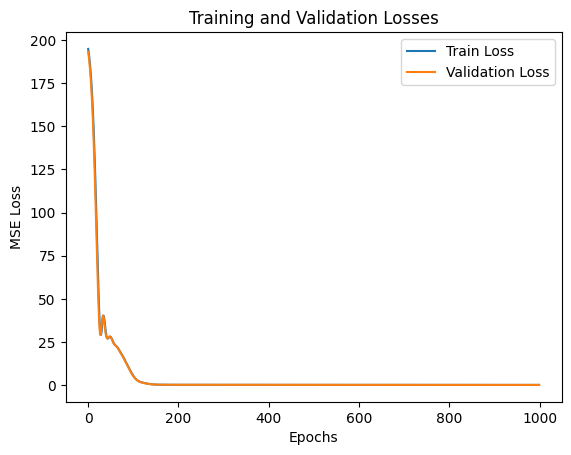

In [3]:
# --- STEP 1: TRAIN THE DEEP MODEL (GPU OPTIMIZED) ---

# 1. SETUP DEVICE
# Check if GPU is available (CUDA for NVIDIA, MPS for Mac M1/M2)
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using Device: {device}")

# 2. PREPARE DATA
print("Generating Training Data...")
train_x, train_y = generate_balanced_training_data(n_samples=20000)
val_x, val_y = generate_balanced_training_data(n_samples=2000) 

# --- CRITICAL CHANGE 1: Move Data to GPU ---
# We move the entire dataset to GPU memory once (since it's small enough)
# This is much faster than moving small batches inside the loop.
train_x = train_x.to(device)
train_y = train_y.to(device)
val_x = val_x.to(device)
val_y = val_y.to(device)

# 3. SETUP MODEL
dkf = TransitionNet()
# --- CRITICAL CHANGE 2: Move Model to GPU ---
dkf.to(device) 

optimizer = optim.Adam(dkf.parameters(), lr=0.005)
criterion = nn.MSELoss()

# 4. TRAINING LOOP
train_losses = []
val_losses = []

print("Starting training...")
for epoch in range(1000):
    dkf.train() 
    optimizer.zero_grad()
    
    # Everything happens on GPU now because model & data are there
    predictions = dkf(train_x) 
    loss = criterion(predictions, train_y)
    
    loss.backward()
    optimizer.step()
    train_losses.append(loss.item())
    
    # Validation
    dkf.eval()
    with torch.no_grad():
        val_predictions = dkf(val_x)
        val_loss = criterion(val_predictions, val_y)
        val_losses.append(val_loss.item())
        
    if epoch % 50 == 0:
        print(f"Epoch {epoch}: Train Loss {loss.item():.5f}, Val Loss {val_loss.item():.5f}")
    if val_loss.item() > train_losses[-1] * 1.5:
        print("Early stopping due to overfitting.")
        break

# 5. PLOT LOSSES
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.title("Training and Validation Losses")
plt.xlabel("Epochs")
plt.ylabel("MSE Loss")
plt.legend()
plt.show()

Using Device: cuda
Generating Training Data...
Starting training...
Epoch 0: Train Loss 0.15576, Val Loss 0.14997
Epoch 50: Train Loss 0.08234, Val Loss 0.08307
Epoch 100: Train Loss 0.03969, Val Loss 0.03985
Epoch 150: Train Loss 0.01924, Val Loss 0.01979
Epoch 200: Train Loss 0.01685, Val Loss 0.01737
Epoch 250: Train Loss 0.01645, Val Loss 0.01691
Epoch 300: Train Loss 0.01618, Val Loss 0.01658
Epoch 350: Train Loss 0.01599, Val Loss 0.01651
Epoch 400: Train Loss 0.01584, Val Loss 0.01636
Epoch 450: Train Loss 0.01553, Val Loss 0.01584
Epoch 500: Train Loss 0.01526, Val Loss 0.01551
Epoch 550: Train Loss 0.01515, Val Loss 0.01522
Epoch 600: Train Loss 0.01472, Val Loss 0.01491
Epoch 650: Train Loss 0.01439, Val Loss 0.01456
Epoch 700: Train Loss 0.01400, Val Loss 0.01422
Epoch 750: Train Loss 0.01355, Val Loss 0.01366
Epoch 800: Train Loss 0.01300, Val Loss 0.01302
Epoch 850: Train Loss 0.01264, Val Loss 0.01244
Epoch 900: Train Loss 0.01162, Val Loss 0.01157
Epoch 950: Train Loss 0

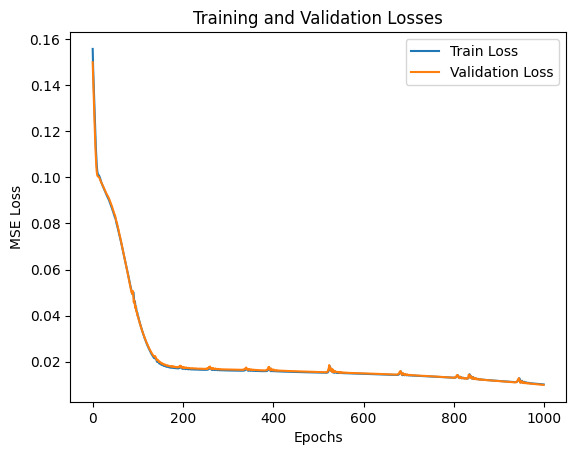

In [4]:
# --- STEP 1: TRAIN THE DEEP MODEL (GPU OPTIMIZED) ---

# 1. SETUP DEVICE
# Check if GPU is available (CUDA for NVIDIA, MPS for Mac M1/M2)
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using Device: {device}")

# 2. PREPARE DATA
print("Generating Training Data...")
train_x, train_y = generate_balanced_training_data(n_samples=20000)
val_x, val_y = generate_balanced_training_data(n_samples=2000) 

# --- CRITICAL CHANGE 1: Move Data to GPU ---
# We move the entire dataset to GPU memory once (since it's small enough)
# This is much faster than moving small batches inside the loop.
train_x = train_x.to(device)
train_y = train_y.to(device)
val_x = val_x.to(device)
val_y = val_y.to(device)

# 3. SETUP MODEL
skf = StructuredTransitionNet()
# --- CRITICAL CHANGE 2: Move Model to GPU ---
skf.to(device) 

optimizer = optim.Adam(skf.parameters(), lr=0.005)
criterion = nn.MSELoss()

# 4. TRAINING LOOP
train_losses = []
val_losses = []

print("Starting training...")
for epoch in range(1000):
    skf.train() 
    optimizer.zero_grad()
    
    # Everything happens on GPU now because model & data are there
    predictions = skf(train_x) 
    loss = criterion(predictions, train_y)
    
    loss.backward()
    optimizer.step()
    train_losses.append(loss.item())
    
    # Validation
    skf.eval()
    with torch.no_grad():
        val_predictions = skf(val_x)
        val_loss = criterion(val_predictions, val_y)
        val_losses.append(val_loss.item())
        
    if epoch % 50 == 0:
        print(f"Epoch {epoch}: Train Loss {loss.item():.5f}, Val Loss {val_loss.item():.5f}")
    if val_loss.item() > train_losses[-1] * 1.5:
        print("Early stopping due to overfitting.")
        break

# 5. PLOT LOSSES
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.title("Training and Validation Losses")
plt.xlabel("Epochs")
plt.ylabel("MSE Loss")
plt.legend()
plt.show()

In [15]:
kf = KalmanFilter(
    transition_matrices=[[1,0,1,0], [0,1,0,1], [0,0,1,0], [0,0,0,1]],
    observation_matrices=[[1,0,0,0], [0,1,0,0]],
    transition_covariance=np.eye(4)*0.01, 
    observation_covariance=np.eye(2)*5.0,
)


In [16]:
# --- RUNNING THE COMPARISON ---
# Pass the list of models explicitly!
# assuming kf, dkf, skf are defined variables
models_list = [kf, dkf, skf] 
gt, obs, ests = compare_models(models_list,consistent=False)

Running Classical KF...
Running Deep Model: TransitionNet...
Running Deep Model: StructuredTransitionNet...


In [17]:
# --- ANIMATION ---
anim = animate_trajectories(
    ground_truth=gt[:, :2], 
    estimates=[ests[kf][:, :2], ests[dkf][:, :2], ests[skf][:, :2]], 
    labels=["Classical KF", "Deep KF", "Structured DKF"]
)
display(anim)

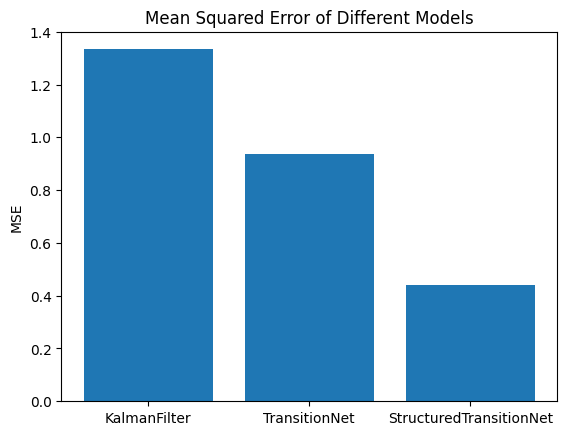

In [18]:
errors = {}
for model in models_list:
    est = ests[model]
    mse = np.mean((est[:, :2] - gt[:, :2])**2)
    errors[type(model).__name__] = mse

plt.bar(errors.keys(), errors.values())
plt.title("Mean Squared Error of Different Models")
plt.ylabel("MSE")
plt.show()